**👉 Project Address**: http://www.student.dtu.dk/~s212400/index.html

# Contribution Table

In [1]:
import pandas as pd

d = {'Video' : ['ALL'], 
    'Building the Network' : ['Bufan','Bufan','Bufan','Bufan,Leandro'], 
     'Sentiment Analysis' : ['Geng'],
     'Community Analysis' : ['Leandro'],
     'WordCloud' : ['Bufan', 'Bufan', 'Bufan,Leandro', 'Bufan,Leandro'],
     'Website' : ['Bufan']
     } 
  
ct = pd.DataFrame(d, index=['Part 1', 'Part 2', 'Part 3', 'Part 4']) 

ct

,Video,Building the Network,Sentiment Analysis,Community Analysis,WordCloud,Website
Part 1,ALL,Bufan,Geng,Leandro,Bufan,Bufan
Part 2,ALL,Bufan,Geng,Leandro,Bufan,Bufan
Part 3,ALL,Bufan,Geng,Leandro,"Bufan,Leandro",Bufan
Part 4,ALL,"Bufan,Leandro",Geng,Leandro,"Bufan,Leandro",Bufan


# Motivation

In [7]:
from IPython.display import HTML
# Youtube
HTML('<div align="middle">\
         <iframe width="560" height="315" src="https://www.youtube.com/embed/Hed8Jvpne8w" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen>\
         </iframe>\
     </div>')

## What is your dataset?
We decided to analyze the Runeterra World, based on the computer game League of Legends, by Riot Games.Our dataset includes the current champions that you can play in the game, and we use the connections between each other, their in-game audio, and more.<br>

Data source:
- https://leagueoflegends.fandom.com/wiki/League_of_Legends_Wiki (mainly use the most popular and up-to-date wiki)
- https://www.leagueoflegends.com/en-us/champions/(we will also use the official LoL webpage)<br>
LOL's official has a clear structure of champion list which is easy to get all champions' names by BeautifulSoup `find_all` function. We matched these names by finding labels with the same `class` in the HTML text file requested. 

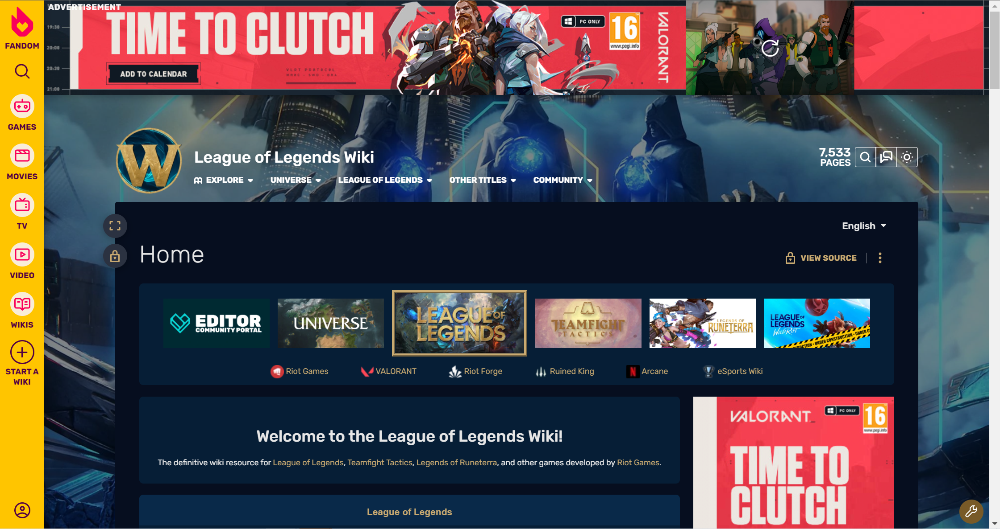

## Why did you choose this/these particular dataset(s)?

We chose this dataset because all of us are big fans and regular players of the game, and we found it to be interesting to get deeper in the history of the characters and relationships. League of Legends is currently one of the most popular games in the world, counting on 180 million active monthly users. We developed this project in order to create an idea  about a feasible movie with their most relevant characters.

## What was your goal for the end user's experience?
Our goal is to catch attention for all those who like playing the game, finding this project to be interesting, allowing the end user to get deeper in champions connections, history and other useful data, and why not to also attract those who had never played the game to give it a try.


# Basic stats | Building the network
## Choices in data cleaning and preprocessing
We used `Beautiful Soup` to find champions and the relationships that a champion has with the rest, by searching on the wiki’s page of every character. Also, there is a section that lists all the audio text. We can use Beautiful Soup selector to extract them based on html structure. 

Also, we used `API` to access champion’s background story and extract it from JSON structure to load the text assigned to every champion and then save each champion’s story to txt file for later sentiment analysis and Wordcloud generation.

## Write a short section that discusses the dataset stats (here you can recycle the work you did for Project Assignment A)

Our network has 157 nodes that represent all the champions -possible characters of the movie- that can be played in the game. It has 1200 directed edges between them, the average in-degree and out-degree are about 8.9. 

Our whole project folder including data and images collected weighs 59 Mb. It contains a csv file (with champion’s names and their attributes, champion audio-text, champion explain-text and the analysis of the network.
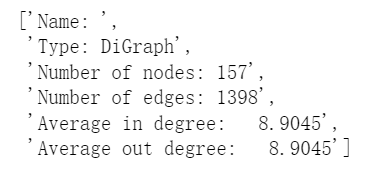

# Tools, theory and analysis. Describe the process of theory to insight
## Analysis step: Building the network
**1. Explain what you’re interested in<br>**
We're interested about the 157 champions' correlation and how their characteristics shaped according to their background story.

**2. Explain the tool<br>**
- `Wiki API`
> Because Fandomwiki is built using MediaWiki, which in turn supports an API. The goal of Wiki API is to provide direct, high-level access to the data contained in the MediaWiki databases.
- `requests`, `beautifulsoup`
> Requests library is one of the integral part of Python for making HTTP requests to a specified URL. 
- `Networkx`
> NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks.
- `Gephi`
> Gephi is the leading visualization and exploration software for all kinds of graphs and networks. 

Use these tools, we can extract data we need from Fandom wiki, build and visualize the champion network we want.
**3. Apply the tool<br>**
Using API, requests and beautiful soup to collect champion names as nodes, champion faction, role as node attributes. Next, we can use networkx to build the network and inspect its node, egde and degree information. Lastly, we dropped the lonely nodes and save the largest giant undirected component as gml graph file and then visualize it, adjuest node size, color different communities based on connectivity by Gephi for a better visual presentation.

**4. Discuss the outcome<br>**
As the network information picture shown previously, our network is not huge. The number of node is 157 and the amout of edges is 1398. Average degree is 8.9. We also find the most connected champions, which are important for later research. According to the degree distribution, the network doesn't really fit in any model. But we can say it's scale free since several nodes are more connected than others, which presents preferential attachment mechanism. 
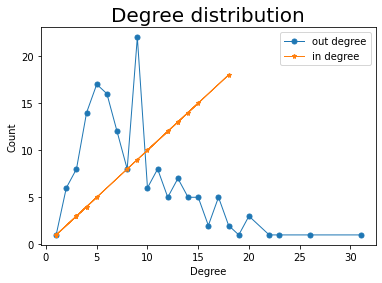
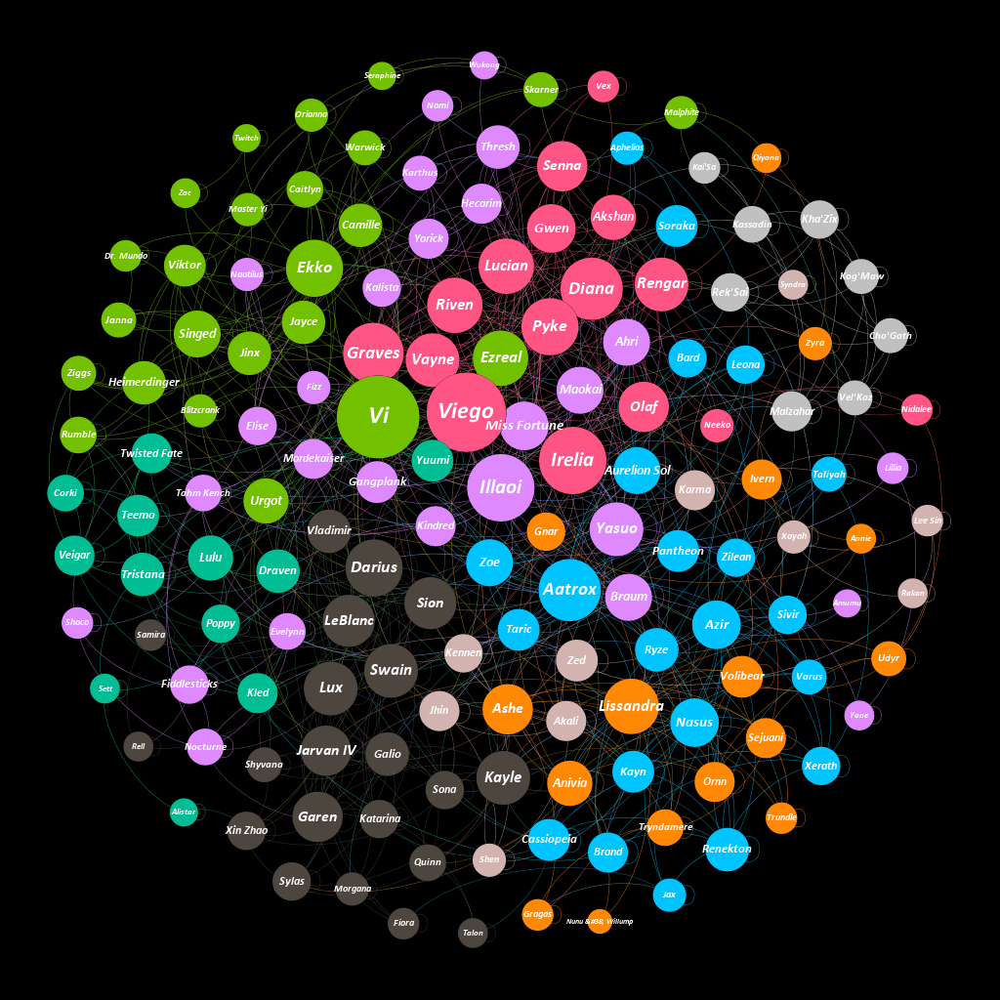
## Analysis step: Communities
1. Explain what you’re interested in<br>
Since it is not possible to have 157 main characters in a movie we decided to partition our champions into communities to see what groups we have and which of them have the potencial to be the principal chacraters in the movie (although some others might be included).
2. Explain the tool<br>
Louvain algorithm
This tool allows us to find the communities with the largest modularity. This algorithm has two steps, first step is to traverse each node and consider each node a community,then try to add a node to a community which makes its modulaity grow fastest, until each node can not be changed. The second step is that it considers each community as a super node and traverse each one of them, then repeat above process. Therefore, the algorithm repeats this until the maximum modularity is found.
3. Apply the tool<br>
We use >>> community.best_partition in our network to try to get the partition with the highest modularity, we got all our communities with this algorithm and then we visualize it in different ways (coloured network and histogram)
4. Discuss the outcome<br>
We got a total of 10 communities with different sizes, with the bigger ones counting with more than 20 nodes, and the smallest one with only 1 node. This gives us some idea of which community we can center our idea. We will consider using one of the top three communities.

## Analysis step:calculate each champion's TF-IDF<br>
1. Explain what you’re interested in<br>
We want to find which words in each champion's explain text are most important for that champion,which could help us to analyze champions,thus we could use TF-IDF to express how important a word is to a champion ,then we could which words are most important to a champion,the we could use those words to help analyze the champion.The main function of this part is to lay a foundation for the later word cloud computing。<br>
2. Explain the tool<br>
TF is the abbreviation of Term Frequency , suppose we want to find which text is most relevant to the query,thus we need to count the number of each word in every text, the number of times a word occurs in each text is called term frequency.<br>
IDF is the abbreviation of inverse document frequency.We need IDF to help us to give smaller weights to some common words and give larger weights to some rare words.IDF = log(Total number of documents in the corpus)/(the number of documents contain the word + 1 ).It is very important,the reason is that this algarithm could give the wight of a word.In the end,TF-IDF＝TF*IDF<br>
3. Apply the tool<br>
__Preprocessing audio text for calculating TF-IDF:__
We don't want to have champion names added to the list of words we use to calculate TF-IDF, so our first step is to remove the champion names from the explain text for each champion.Each champion's explain text contains headers  like `=== Biography ===`,this kind of header is not helpful for us to calculate TF-IDF,thus we should use regular expression to find them and remove them.We use `"==+.*==+"` to find headers,firstly `==` could find the position of header, and `+` could match any number of equal signs, and `.*` could help us to match the content in the middle of the equal sign.After we find the header, we could use `re.sub` to remove it.And then,We use `WhitespaceTokenizer` to split the text by space, then put them in a word list.Then we traverse through all the tokens in the word list, if the token is in the stopword list or the punctuation list we will remove it, and then set all tokens in the word list to lowercase.In the end,we use `WordNetLemmatizer` to set the format of all words to their most original state.
__Calculating TF-IDF:__
We know IDF = log(Total number of documents in the corpus)/(the number of documents contain the word + 1 ), we just set all champions' explain text as the corpus, each champion's explain text as a document, thus we could calculate the IDF.TF = (frequency of a token )/(total number of tokens in a document ),and then we could calculate TF-IDF.
4. Discuss the outcome<br>
In this section we just calculate each champion's TF-IDF，and in the following analysis process ,we will use TF-IDF to get the wordclouds and combine the sentiment to analyze champions.

## Analysis step 3:sentiment analysis<br>

1. Explain what you’re interested in<br>
We need to find a method to express the overall emotional degree of each champion.
Thus we choose use Dictionary-based sentiment to calculate each champion’s sentiment , and we use the LabMT wordlist and the VADER lexicon to calculate each champion’s sentiment with different process.After we calculate each champion’s sentiment,we analyze and compare the results obtained by the two different methods, thus we could choose an optimal method.
2. Explain the tool<br>
__LabMIT wordlist:__
The LabMT wordlist ranks words by their degree of happiness, that is each word in the LabMT wordlist has a value of happiness_average, the higher this value is the happier the word is.This method can be applied to various types of text,and it's a good method to work with larger text.So if we want to use this method to calculate each champion’s sentiment, we could look for a text about the champion and then convert this text into the word list to calculate sentiment.<br>
__Vader lexicon:__
The outcome of VADER analyzer is a dictionary containing neutrual,positive or negative and compound judgement score about give list of texts. We think it is very important because when people want to express their emotion more specifically or directly, they will use those tools to help them.Thus with the help of VADER, maybe we could get more accurate results compared to other dictionary-based method , we will verity this point in the following analysis process.<br>
__Selecting text:__
Then, what kind of text should we look for?We think it is the champion’s audio text.First reason is that the lines spoken by each champion could well reflect the champion’s sentiment.We could understand whether the champion’s overall emotion is happy or sad through each champion’s lines.Second reason is that each champion has a very specific audio text in Wikipedia, and the specific audio text is very helpful for us to analyze their sentiment.<br>
3. Apply the tool<br>
__Vader lexicon:__
Our approach is to loop each champion and loop their dialogue sentence based on the ‘champion_dialogues’ dictionary we obtained in the following process. Afterwards, use the VADER analyser to get each sentence's features rated result. Lastly, index `compound` and sum each result values in sentences ending by calculating their mean.<br>
__Preprocessing the audio text for using Vader lexicon:__
Our audio text is not json format, thus we need to preprocess them.Our solution is to use function `literal_eval` to help us split the audio text. After we use this function to split the audio text into sentences, we find that there are still some small problems in each sentence,each sentence is wrapped in double quotation marks `""`, and also some sentences contain  eascape symbol `\`.Our solution is to use regular expression`"[\"]"` to find the double quotation marks in each sentence and then use `re.sub` to replace them with empty space.And for `\`,out solution is to tranverse each sentence and if `\` is in that sentence , we will  use empty space to replace it.
4. Discuss the outcome<br>
Now, we get the different results obtained by the LabMT wordlist and Vader lexicon., then we could build histogram for the distribution of sentiment values of each result, to analyze overall champions'sentiment.<br>
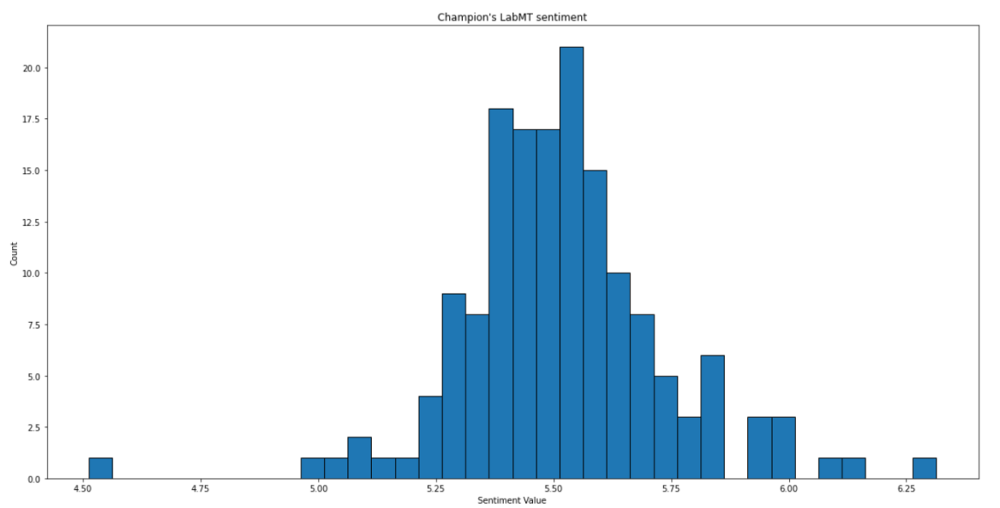
__LabMIT wordlist:__<br>This distribution is basically a normal distribution，through the plot, we could find that the  average sentiment value is around 5.6, thus we could say that most of the champions' sentiment values are distributed between 5.35 and 5.6, through this point we could know the overall mood of the heroes is happier.<br>
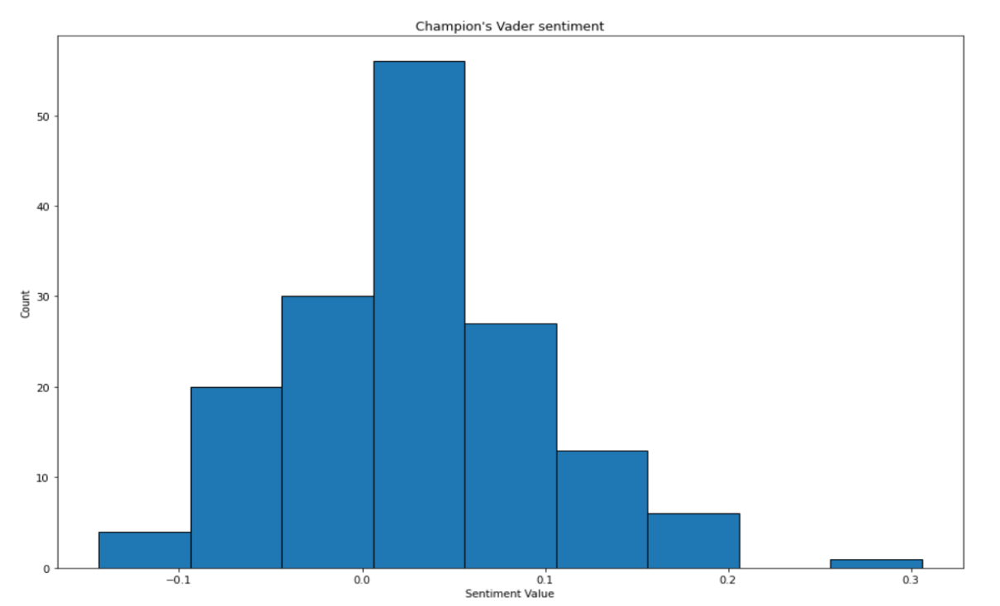
__Vader lexicon:__<br>This distribution is also fitted to normal distribution,the average of sentiment values is around 0.05, so we could know the most of champions' sentiment values are distributed between -0.05 and 0.05,through this point, we could know that the overall mood of champions is not high and tends to a neutral value.<br>
We could find that there is significant difference between the two distributions, but we still don't know which one to choose for our subsequent analysis process, so we can look at the more specific part of the results in the following process.<br>

## Community Sentimental Analysis

1. Explain what you’re interested in<br>
Once we define our communities, we will use these together with the Vander sentimental analysis to make further analysis on which community we should pick. We will get indicators for every community:
* The average sentiment of all champions of each community.
* The standard deviation of this. In order to make an interesting 'dramatic' movie we think that having a good variation between positive and negative characters is key, otherwise it would be boring to see i.e. only happy characters.
* Because in the previous analysis we are still not sure which sentiment method is more suitable for us.In this section we will decide which sentiment analysis method we will ultimately use for our subsequent analysis process
2. Explain the tool<br>
We use tools already explained: Louvain Algorithm,Vader Lexicon, and LabMT wordlist.We will also use statistics.
3. Apply the tool<br>
We looped in our dataframe trough every community to get the standard deviation and mean of the Vader sentiments for champions in that community in the followin way:<br>
statistics.stdev(lol_df[lol_df["Community"]==i]["Vader Sentiment"]) <br>
lol_df[lol_df["Community"]==i]["Vader Sentiment"].mean()<br>
4. Discuss the outcome<br>
With the different sentiment analysis we now get two different results<br>
__LabMIT wordlist:__<br>
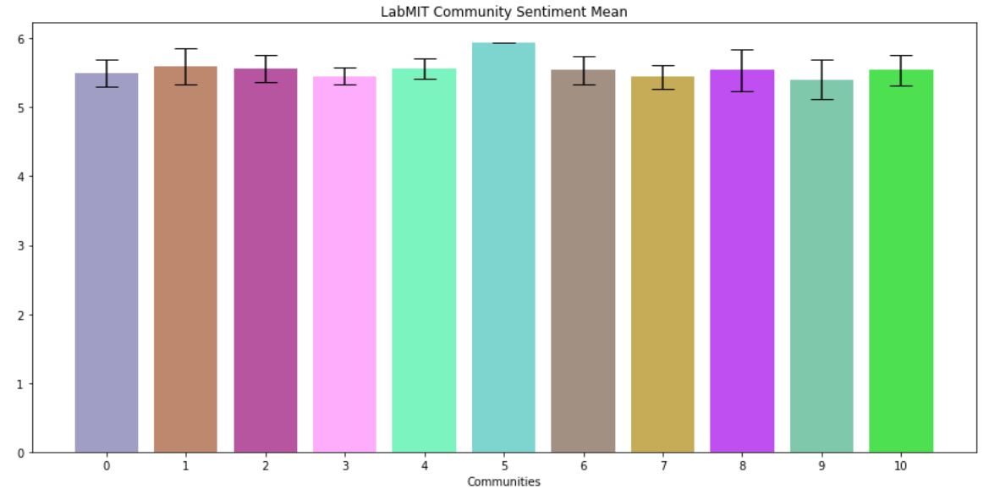
__Vader lexicon:__<br>
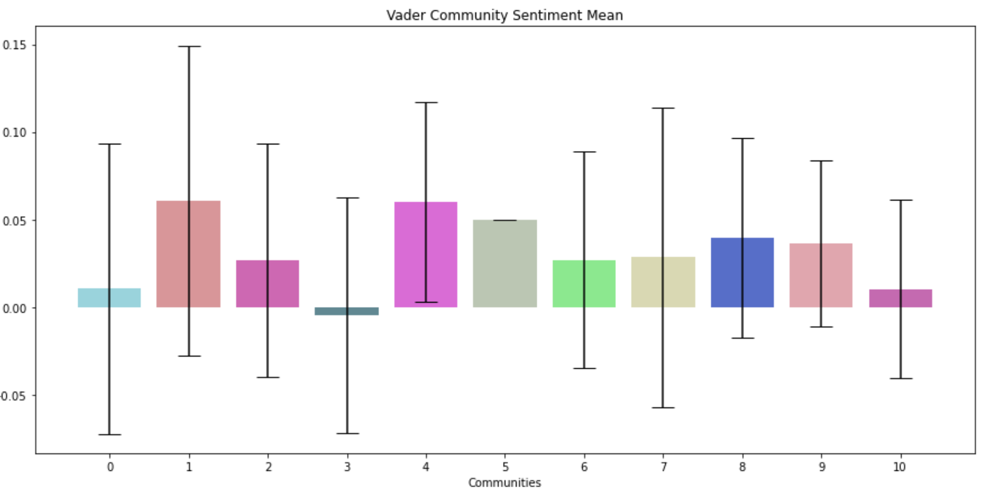
First let's compare the results of two sentiment analysis method, we could see in the LabMT community sentiment mean,there is little difference in the average sentiment of each community,but the results we want to get through sentiment analysis are recognizable,to be specifically,we want to know exactly which champions or communities are happier or sadder,which is more reasonable for us to analyze.Obviously,the results obtained through Vader lexicon have a relatively large difference in mean values between each community.Then,we could combine the previous analysis to state that Vader lexicon is more suitable for us to analyze community sentiment.<br>
Between the top 3 biggest communities (3, 8 and 10), the one with the higher standar deviation is number 3. This information supports our previous analysis, stating that the champions with highest degree belong to this community (hmm Viego...)

# Discussion. Think critically about your creation
## What went well?

We proposed an idea, with an a priori hypothesis, that we could confirm trough the analysis successfully, and everything worked pretty well on that line. 

## What is still missing? What could be improved?, Why?

We could have done a deeper analysis to add links from the audio-texts to. Many are probably repetitions, since usually if two champions interact between each other it is because they have a background history connecting them. But it might also lead to some misunderstanding, since some interactions might not be strong enough to create a background story between two characters.<br>

Another useful thing we could provide Riot to develop their movie is an analysis on the audience champion preferences. By analyzing for example the comments (we tried a lot with no luck) on the wiki, their sentiments, the number of words in them, or simply the number comments, we could add more details to the relevance that a champion means to the players. Even though the most important part is how strong the background history of every character is, this could help us to lean on one champion with as relevant history as another.

# Contribution Table

In [1]:
import pandas as pd

d = {'Video' : ['ALL'], 
    'Basic stats - Building the Network' : ['Bufan','Bufan','Bufan','Bufan,Leandro'], 
     'Sentiment Analysis' : ['Geng'],
     'Community Analysis' : ['Leandro'],
     'WordCloud' : ['Bufan', 'Bufan', 'Bufan,Leandro', 'Bufan,Leandro'],
     'Explanatory Notebook':['ALL'],
     'Website' : ['Bufan','Bufan,Leandro','Bufan,Geng','Bufan']
     } 
  
ct = pd.DataFrame(d, index=['Part 1', 'Part 2', 'Part 3', 'Part 4']) 

ct

,Video,Basic stats - Building the Network,Sentiment Analysis,Community Analysis,WordCloud,Explanatory Notebook,Website
Part 1,ALL,Bufan,Geng,Leandro,Bufan,ALL,Bufan
Part 2,ALL,Bufan,Geng,Leandro,Bufan,ALL,"Bufan,Leandro"
Part 3,ALL,Bufan,Geng,Leandro,"Bufan,Leandro",ALL,"Bufan,Geng"
Part 4,ALL,"Bufan,Leandro",Geng,Leandro,"Bufan,Leandro",ALL,Bufan


# Codes

## Preparation

In [1]:
import re
import pandas as pd 
import numpy as np
import urllib.request
import json
import requests
from bs4 import BeautifulSoup
import networkx as nx
from ast import literal_eval # transform data type
import matplotlib.pyplot as plt

import nltk
from nltk.tokenize import WhitespaceTokenizer
import matplotlib.pyplot as plt
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
import string
from collections import Counter

import math
import statistics
from scipy import stats
import powerlaw
from PIL import Image

In [2]:
%matplotlib inline
import seaborn as sns
np.random.seed(sum(map(ord, "palettes")))

## Building the network

### Nodes: Finding champions by crawling

**Crawl champion names by BeautifulSoup from 'List of Champions' page on LOL official site**

In [46]:
url = 'https://www.leagueoflegends.com/en-us/champions/'
strhtml=requests.get(url)
soup=BeautifulSoup(strhtml.text,'lxml')
spans = soup.find_all(class_='style__Text-n3ovyt-3 gMLOLF')
list_of_champions = [i.text for i in spans]

In [41]:
print('There are',len(list_of_champions),'champions in LOL.')

There are 157 champions in LOL.


The dataframe below is afterprocess by already 

In [3]:
lol_df = pd.read_csv('./lol_df.csv',index_col=0)
lol_df.head()

,Champion,Role,Faction,Sentiment,Vader Sentiment,Community
0,Aatrox,Fighter,Runeterra,5.666132,-0.144017,0
1,Ahri,Mage,Ionia,5.674286,0.068998,1
2,Akali,Assassin,Ionia,5.488501,-0.010173,10
3,Akshan,Marksman,Shurima,5.518679,0.018009,3
4,Alistar,Tank,Runeterra,5.683729,0.059888,4


### Node attributes

#### Champion class(role)

In [43]:
def get_role(champion):
    if champion == 'Dr. Mundo':
        champion = 'dr-mundo'
    elif champion == 'Nunu & Willump':
        champion = 'nunu'
    champion = champion.lower()
    # replace ' ', '.', '&', '''
    specialChars = '\'& . '
    for specialChar in specialChars:
        if specialChar in champion:
            champion = champion.replace(specialChar, '-')
    url = f'https://www.leagueoflegends.com/en-us/champions/{champion}/'
    strhtml=requests.get(url)
    soup=BeautifulSoup(strhtml.text,'lxml')
    spans = soup.select('#gatsby-focus-wrapper > div > section.style__Wrapper-sc-8gkpub-30.hvTntU > div.style__SectionInner-sc-8gkpub-3.drSgts > div.style__Dock-sc-8gkpub-5.eVSOFq > div.style__Info-sc-8gkpub-7.kTzPTF > div.style__Specs-sc-8gkpub-8.eBpPDq > ul > li.style__SpecsItem-sc-8gkpub-12.hsnFYj > div.style__SpecsItemValue-sc-8gkpub-15.kPaHxk')
    
    return spans[0].get_text()

In [46]:
print('LOL has',lol_df.Role.unique(),len(lol_df.Role.unique()),'types of roles.')

LOL has ['Fighter' 'Mage' 'Assassin' 'Marksman' 'Tank' 'Support'] 6 types of roles.


In [34]:
factions = ['Bandle City','Buhru','Blessed Isles','Bilgewater','Demacia','Freljord','Ionia','Ixtal','Noxus','Piltover','Runeterra','Shadow' 'Isles','Shurima','Targon','The Void','Void','Zaun']

#### Champion Faction

In [35]:
# set a dictionary to store each champion's faction
champion_faction = {}
# get faction(regions)
def get_faction(faction):
    # get champion list according to given faction
    url = f'https://leagueoflegends.fandom.com/wiki/{faction}'
    strhtml=requests.get(url)
    soup=BeautifulSoup(strhtml.text,'lxml')
    spans = soup.select('#featured > span > a:nth-child(2)')
    # list of champions belonging to given faction 
    text = [line.get_text() for line in spans]
    for i in text:
        champion_faction[i] = faction

In [36]:
for i in factions:
    get_faction(i)

In [37]:
len(champion_faction) # There are 157 champions. We still have 5 champions without fraction

152

In [38]:
# find complement set of our dictionary to see which champion is homeless
# loop homeless champions assign their faction with Unknown temporarily
for i in set(lol_df['Champion']) - set(champion_faction.keys()):
    champion_faction[i] = 'Unknown'
    
lol_df['Faction'] = lol_df['Champion'].apply(lambda x : champion_faction[x])

**Check the collection of data**

In [39]:
# print champions without fraction
unknown_champ = lol_df[lol_df['Faction']=='Unknown']['Champion']
print(unknown_champ)

35               Gnar
36             Gragas
38               Gwen
84     Nunu & Willump
104             Senna
136               Vex
148              Yone
Name: Champion, dtype: object


_Among those homeless champions, they have ambiguous origins in wiki, but I could manually assign the faction based on League's official stories._

In [40]:
# these champions both lives or born in Freljord so assign them with Freljord
mask = lol_df['Champion'].isin(['Gragas','Gnar','Nunu & Willump'])
lol_df.loc[mask,'Faction'] = 'Freljord'

# Vex comes from Bandle city, however she cooperates with Viego and lives in Shadow Isles
mask2 = lol_df['Champion'].isin(['Vex','Gwen'])
lol_df.loc[mask2,'Faction'] = 'Shadow Isles' 

# Yone is Yasuo's brother so their hometown is the same, although Yone is thought to be lost but we can still assign he with Ionia
mask2 = lol_df['Champion'].isin(['Yone'])
lol_df.loc[mask2,'Faction'] = 'Ionia' 

mask2 = lol_df['Champion'].isin(['Senna'])
lol_df.loc[mask2,'Faction'] = 'Blessed Isles'

**Add to nodes**

In [41]:
# create an empty graph
G = nx.DiGraph()

In [42]:
for i in range(0,lol_df.shape[0]):
    G.add_node(lol_df.Champion.values[i],\
                 Role = lol_df.Role.values[i],
                 Faction = lol_df.Faction[i])

### Edges: Discover links between champions by API and Regrex

**Brief steps:**
>1. Query each champion page by API
>2. Save its json file to text
>3. Discover relationships in each character's text file by Regrex

First, I defined a function to help us get the query of each champion so we're able to download each champion's background story as text for later use(relationship mining,sentiment analysis).

In [43]:
#  get the query of each champion
def get_query(champion):
    if ' ' in champion:
        champion = champion.replace(" ", "_")
    elif 'é' or '\'' in champion:
        champion = urllib.parse.quote_plus(champion)
        
    # Get champions' names from List of Champions' page
    baseurl = "https://leagueoflegends.fandom.com/api.php?"
    action = "action=query"
    title = "titles={}".format(champion)
    content = "prop=extracts&exlimit=1&explaintext"
    dataformat ="format=json"
    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)

    return query

In [44]:
# save champion json page to text file 
def save_character_page(champion):
    query = get_query(champion)
    wikiresponse = urllib.request.urlopen(query, timeout=5)
    wikidata = wikiresponse.read()
    wikitext = wikidata.decode('utf-8')
    wikijson = json.loads(wikitext)
    
    # get right key from nested json file 
    pageid = list(wikijson['query']['pages'])[0]
    text = wikijson['query']['pages'][pageid]['extract']
    
    filename = f'./ChampionExplainText/{champion}.txt'
    with open(filename,mode='w',encoding='utf-8') as f:
        f.write(text)
        f.close()

In [47]:
# loop all champions. download all of pages to local
for character in list_of_champions:
    save_character_page(character)

**>>Save dataframe to csv so we can reuse**

In [60]:
lol_df.to_csv('./lol_df.csv')

#### Discover relationships between champions

_Connect champions if their name shows in each other's background story_

In [49]:
for champion in lol_df.Champion:
    with open(f'./ChampionExplainText/{champion}.txt',mode='r',encoding='utf-8') as f:
        text = f.read()
        for i in lol_df.Champion:
            if i in text:
                G.add_edge(champion,i)

#### add edges between champions

In [50]:
def get_relationships(champion):
    url = f'https://leagueoflegends.fandom.com/wiki/{champion}'
    strhtml = requests.get(url)
    soup = BeautifulSoup(strhtml.text,'html.parser')
    data = soup.select("table tbody tr td div div a")
    # get tex within all HTML labels and concat to a list of audio scripts
    text = [line.get_text() for line in data]
    # remove '' element in list
    while '' in text:
        text.remove('')
    return text

In [51]:
for champion in lol_df.Champion:
    links = get_relationships(champion)
    for i in links:
        if i in lol_df.Champion.values:
            G.add_edge(champion,i)

In [52]:
# general info of our graph
nx.info(G).split('\n')

['Name: ',
 'Type: DiGraph',
 'Number of nodes: 157',
 'Number of edges: 1398',
 'Average in degree:   8.9045',
 'Average out degree:   8.9045']

**>>save our network to gml graph file so we can directly read it next time**

In [53]:
# write Directed graph
nx.write_gml(G, 'lolG.gml')

### Network visualization

In [14]:
# read Graph
G = nx.read_gml('lolG.gml')

#### Degree distribution

In [4]:
# finding values and value counts for distribution plot
in_deg = list(dict(G.in_degree()).values())
value_in, value_in = np.unique(in_deg, return_counts=True)

out_deg = list(dict(G.out_degree()).values())
value_out, count_out = np.unique(out_deg, return_counts=True)

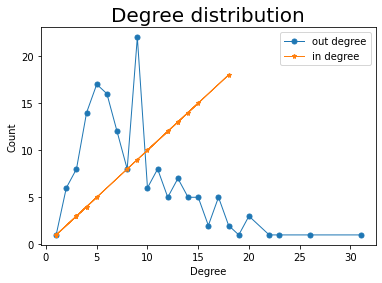

In [5]:
plt.title("Degree distribution", size=20)
plt.plot(value_out, count_out, linewidth=1, marker="o", markersize=5)
plt.plot(value_in, value_in, linewidth=1, marker="*", markersize=5)
plt.xlabel("Degree")
plt.ylabel("Count")
plt.legend(['out degree','in degree'])
plt.show()

Most of champions have 20 around out-degree. About 2 champions have out-degree more than 30.

Top 5 most connected champions:

In [55]:
sorted(dict(G.out_degree()).items(),key=lambda x:x[1],reverse=True) [0:5] # based on out-degree

[('Viego', 31), ('Irelia', 26), ('Diana', 23), ('Aatrox', 22), ('Graves', 20)]

In [56]:
sorted(dict(G.in_degree()).items(),key=lambda x:x[1],reverse=True) [0:5] # based on in-degree

[('Vi', 32), ('Viego', 29), ('Irelia', 22), ('Graves', 21), ('Diana', 20)]

Top 5 loneliness champions:

In [71]:
sorted(dict(G.out_degree()).items(),key=lambda x:x[1],reverse=False) [0:5] # based on out-degree

[('Rammus', 1),
 ('Amumu', 2),
 ('Annie', 2),
 ('Dr. Mundo', 2),
 ('Nunu & Willump', 2)]

In [72]:
sorted(dict(G.in_degree()).items(),key=lambda x:x[1],reverse=False) [0:5] # based on in-degree

[('Nunu & Willump', 0), ('Rammus', 1), ('Amumu', 2), ('Janna', 2), ('Vex', 2)]

#### Role Analysis

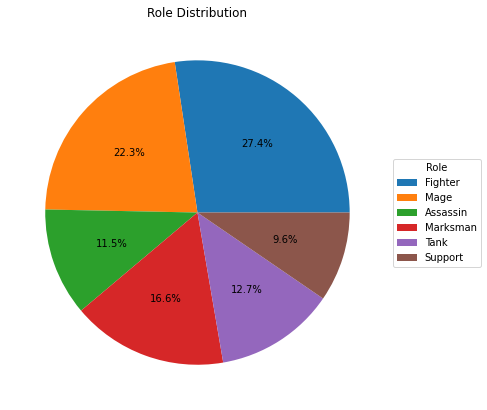

In [11]:
roles = lol_df.Role.unique()
role_counts = dict(lol_df.Role.value_counts())
data = [role_counts[i] for i in roles]

fig, ax = plt.subplots(figsize =(10, 7))
ax.pie(data,autopct='%.1f%%')

ax.set_title('Role Distribution')

# Adding legend
ax.legend(roles,
          title ="Role",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))

_About half of champions are Fighters and Mages in the universe of League of Legends. The third largest group is Marksmen. Tank and Assassin ranks below, while Support account for the least proportion of champions._

#### Champion Network - Colored based on Faction

In [63]:
largest = max(nx.weakly_connected_components(G)) #Obtaining the Giant Connected Component.
LG = G.subgraph(largest) #Creating graph of the Giant connected component.
UGG = nx.to_undirected(LG) #Giant Connected component undirected.

In [75]:
# write Directed graph
nx.write_gml(UGG, 'lolUGG.gml')

In [64]:
from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2()
pos = forceatlas2.forceatlas2_networkx_layout(UGG) 

100%|███████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 958.59it/s]

BarnesHut Approximation  took  0.02  seconds
Repulsion forces  took  0.08  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


In [65]:
sizemap = [nx.degree(UGG, node)*50 for node in UGG.nodes()]
colors = list(sns.color_palette("muted", lol_df.Faction.nunique()))# create color pattern by sns palette
faction_color_zip =  dict(zip(lol_df.Faction.unique(),colors))

In [66]:
colormap= []
for i in UGG.nodes:
    color_code = faction_color_zip[lol_df[lol_df['Champion']==i].iloc[0]['Faction']]
    colormap.append(color_code)

In [67]:
# cmap
node_options = {
    'node_color':colormap,
    'node_size':sizemap,
    'alpha':0.8,
}

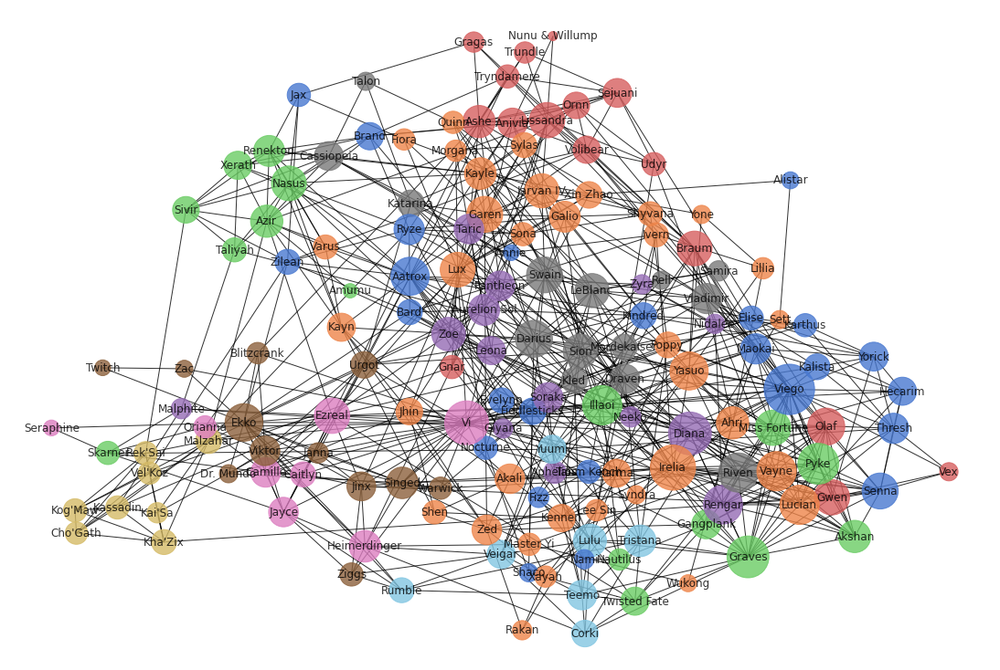

In [68]:
plt.figure(figsize=(15,10))
nx.draw(UGG,pos,with_labels=True,**node_options)

Text(0.5, 1.0, 'Population Distribution of LOL Factions')

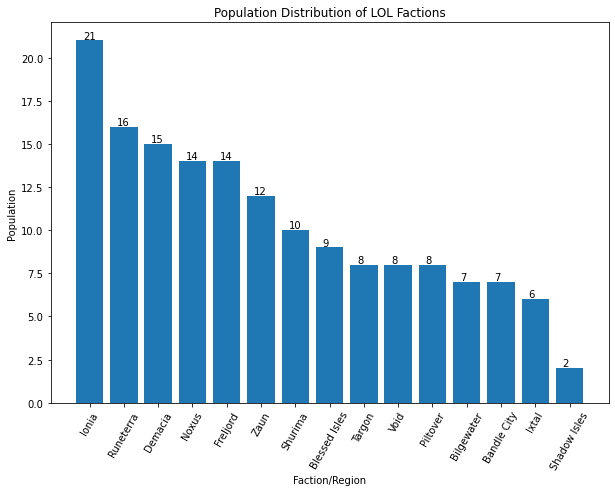

In [69]:
faction_n_ppl = dict(lol_df.Faction.value_counts())
x = [i for i in faction_n_ppl.keys()]
y = [i for i in faction_n_ppl.values()]

plt.figure(figsize=(10,7))
plt.bar(x, y)
plt.xticks(range(len(lol_df.Faction.unique())), x, rotation = '60')
for i in range(len(x)):
    plt.text(i-0.2,y[i]+0.1,y[i]) # add value labels
plt.ylabel('Population')
plt.xlabel('Faction/Region')
plt.title('Population Distribution of LOL Factions')

- It is obvious that Ionia has the most champions. 
- It could be a great background place for League's story if we're gonna make a big movie. 
- Runeterra, Demacia, Noxus and Freljord where have around 15 champions might also be good options. 

**However, an appporiate number of sentimental characters and good plots are the most important factors to an intriguing movie.
The complex and conflict relationships between characters can always attract audiences' eyes 
Thus, community partition is the answer! Each champion's sentiment would also be analyzed to see if they have the quality to be a role people would love or hate..**

#### Community Network
 Previously we save our network as gml graph file and then we could make use of <a href='https://gephi.org/'>Gephi</a> to have a better visualization.

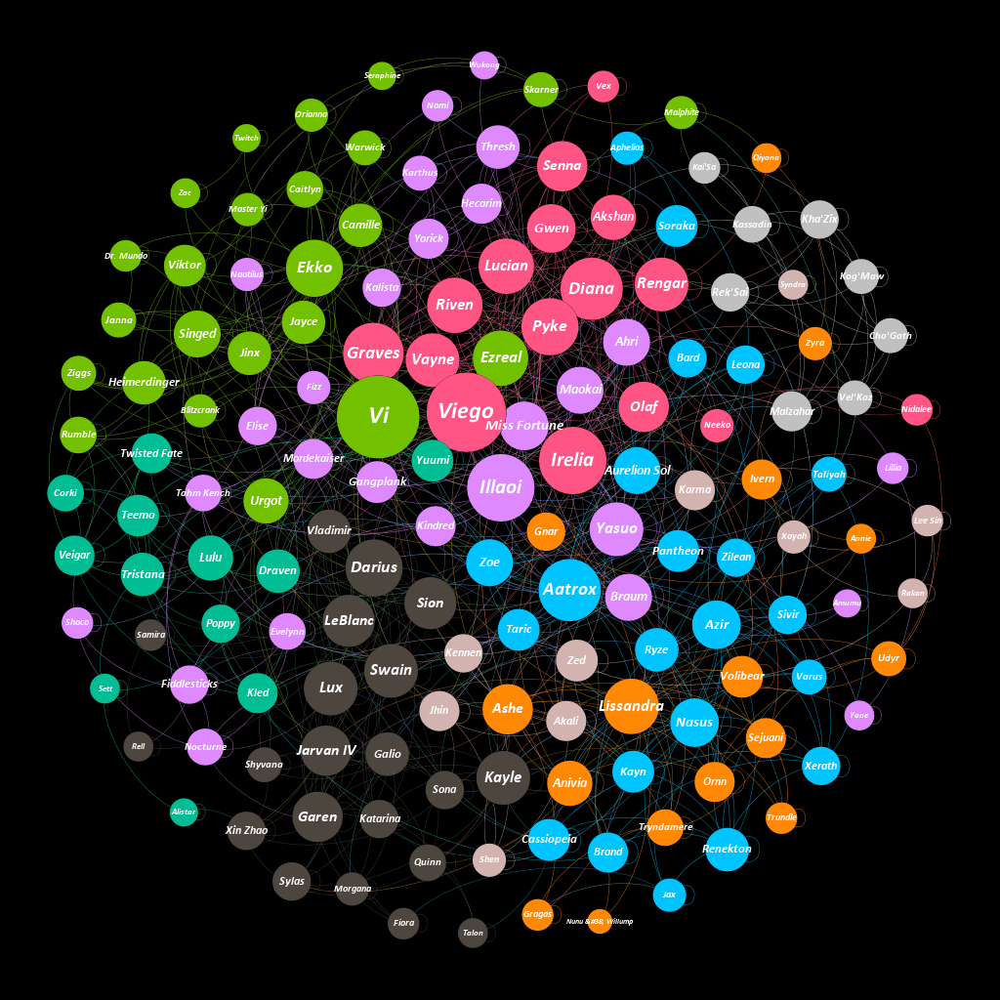

In [71]:
import community as community_louvain
# read Graph
UGG = nx.read_gml('lolUGG.gml')
partition = community_louvain.best_partition(UGG)

In [72]:
n_communities = len(set(partition.values()))

In [76]:
df_community = pd.DataFrame(list(partition.items()),columns = ['Champion','Community'])
df_community.set_index("Champion", inplace=True)
try:#In case you run it more than once
    del lol_df["Community"]
except:
    pass
lol_df = pd.merge(lol_df, df_community[['Community']], on='Champion', how='inner')

In [77]:
n_champs_community = [len(lol_df[lol_df["Community"]==i]) for i in range(n_communities)]

In [78]:
def get_community_colors(n):
    return ['#%02x%02x%02x' % tuple(np.random.randint(256, size = 3)) for _ in range(n)]
colors = get_community_colors(n_communities)

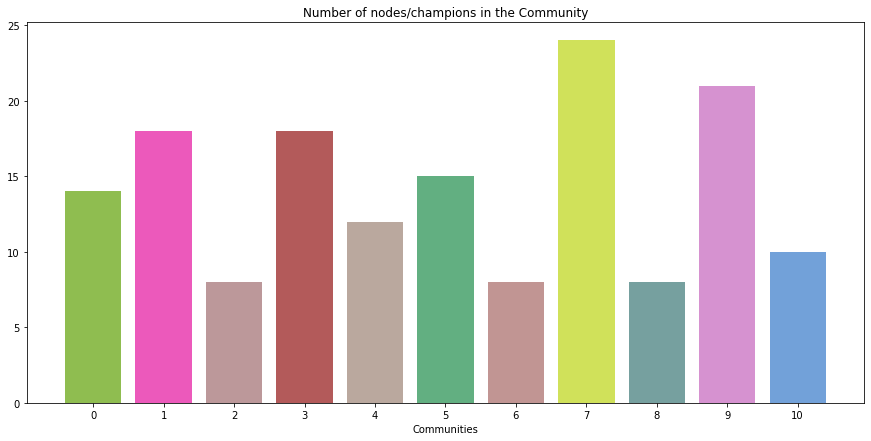

In [79]:
plt.figure(figsize=(15,7)) #Let's see clearly how many champions every community has.
plt.bar(range(n_communities),n_champs_community,align='center', alpha=0.7, ecolor='black', capsize=10, color = colors)
plt.xticks(range(n_communities),range(n_communities))
plt.xlabel("Communities")
plt.title('Number of nodes/champions in the Community')
plt.show()

In [120]:
lol_df.to_csv('./lol_df.csv') #Let's save our new DF, just in case.

## Sentiment Analysis

### Get audio scripts of each champion

In [88]:
def get_audioScript(champion):
    url = f'https://leagueoflegends.fandom.com/wiki/{champion}/LoL/Audio'
    strhtml = requests.get(url)
    soup = BeautifulSoup(strhtml.text,'html.parser')
    data = soup.select('#mw-content-text > div.mw-parser-output > ul > li > i')
    data2 =  soup.select('#mw-content-text > div > div > div> ul > li > i')

    # get text within all HTML labels and concat to a list of audio scripts
    text = [line.get_text() for line in data]
    text2 = [line.get_text() for line in data2]
    text.extend(text2)
    if champion == 'Nunu':
        filename = f'./ChampionAudioText/Nunu & Willump.txt'
        with open(filename,mode='w',encoding='utf-8') as f:
            f.write(str(text))
            f.close()
    else:
        filename = f'./ChampionAudioText/{champion}.txt'
        with open(filename,mode='w',encoding='utf-8') as f:
            f.write(str(text))
            f.close()

In [89]:
for i in list_of_champions:
    if i == 'Nunu & Willump':
        get_audioScript('Nunu')
    else:
        get_audioScript(i)    

**Now we have got all champions' audio text, next step is to analyse their sentiment.**

### Explain:TF-IDF

In [16]:
page_path = r"./ChampionExplainText/"

In [103]:
from nltk.tokenize import WhitespaceTokenizer

def remove_multiple_words(description):
    split_characters_name =[]
    
    for i in lol_df.Champion :
        if ' ' in i:
            h = i.split(' ')
            if len(h)<=3:
                for i in range(len(h)):
                    split_characters_name.append(h[i])
            else:
                split_characters_name.append(h[0])
        else:
            split_characters_name.append(i)
            
            
    word_tokenizer = WhitespaceTokenizer()
    raw_words_list = word_tokenizer.tokenize(description)
    
    words_list = [i for i in raw_words_list if i not in split_characters_name]
    h = ' '.join(words_list)
    return h

In [104]:
#preprocess explian text
champions_explain_words={}
pattern ="==+.*==+" 


split_characters_name =[]
for i in lol_df.Champion :
    if ' ' in i:
        h = i.split(' ')
        if len(h)<=3:
            for i in range(len(h)):
                split_characters_name.append(h[i])
        else:
            split_characters_name.append(h[0])
    else:
        split_characters_name.append(i)
        
        
for champion in lol_df.Champion:
    with open(page_path + champion + '.txt',encoding = 'utf-8')as f:
        
        description = f.read()
        
        words = re.sub(pattern,'',description)
        
        raw_words = remove_multiple_words(words)

        
        word_tokenizer = WhitespaceTokenizer()#split word by space
        raw_words_list = word_tokenizer.tokenize(raw_words)
        
        new_text = ' '.join(raw_words_list)
        
        word_tokenizer = WordPunctTokenizer()
        words_list = word_tokenizer.tokenize(new_text)
        
        re_names_words = [i for i in words_list if i not in split_characters_name]
        
        stop_words = stopwords.words('english')
        punctuation_list = string.punctuation
        words_list = [w.lower() for w in re_names_words if w not in stop_words and any(c.isalpha() for c in w )]
        
        lemmatizer = WordNetLemmatizer()
        words = [lemmatizer.lemmatize(w) for w in words_list ]
        words_again_draw_stop_words = [w for w in words if w not in stop_words]
        champions_explain_words[champion] = words_again_draw_stop_words
     
        

In [105]:
def calculate_IDF(word,dic):
    i = 0
    for key,value in dic.items():
        if word in value:
            i+=1
        
    IDF = math.log(len(dic) / i+1)
    
    return IDF

In [106]:
TF_IDF_explain = {}

for key,value in champions_explain_words.items():
    TF_IDF_dic={}
    words = nltk.Text(value)
    frequency = nltk.FreqDist(words)
    frequency_value = frequency.most_common()
    for i in range(len(frequency_value)):
        h = calculate_IDF(frequency_value[i][0],champions_explain_words)
        TF_IDF = (frequency_value[i][1]/len(value)) * h
        TF_IDF_dic[frequency_value[i][0]]= TF_IDF
    TF_IDF_explain[key] = TF_IDF_dic 

### LabMT  Score

In [17]:
page_path = r"./ChampionAudioText/"

In [96]:
#preprocess audio text for sentiment analysis
champions_audio_sentiment_words={}
for champion in lol_df.Champion:
    with open(page_path + champion + '.txt',encoding = 'utf-8')as f:
        description = f.read()
        
        word_tokenizer = WordPunctTokenizer()
        words_list = word_tokenizer.tokenize(description)
    
        
        lemmatizer = WordNetLemmatizer()
        words = [lemmatizer.lemmatize(w.lower()) for w in words_list ]
        champions_audio_sentiment_words[champion] = words

In [97]:
labMIT = pd.read_csv('./LabMIT-1.0.txt',header = 2 ,sep='\t')
labMIT.head()

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
0,laughter,1,8.50,0.9313,3600,--,--,1728
1,happiness,2,8.44,0.9723,1853,2458,--,1230
2,love,3,8.42,1.1082,25,317,328,23
3,happy,4,8.30,0.9949,65,1372,1313,375
4,laughed,5,8.26,1.1572,3334,3542,--,2332


In [98]:
def calculate_sentiment(words_list):
    nltk_words = nltk.Text(words_list)
    frequency = nltk.FreqDist(nltk_words)
    sentiment_list=[]
    length_words_in_labMIT= 0
    for word in words_list: 
        
        if word in labMIT['word'].values:
            length_words_in_labMIT = length_words_in_labMIT + frequency[word]
            sentiment = frequency[word] * float(labMIT.happiness_average[labMIT['word'].isin([word])])
            sentiment_list.append(sentiment)
    
    mean_sentiment = sum(sentiment_list)/length_words_in_labMIT
    return mean_sentiment

In [99]:
champions_sentiment = {}
for champion,audio in champions_audio_sentiment_words.items():
    champions_sentiment[champion] = calculate_sentiment(champions_audio_sentiment_words[champion])

In [100]:
df_sentiments = pd.DataFrame(list(champions_sentiment.items()),columns = ['Champion','LabMIT Sentiment'])
df_sentiments.set_index("Champion", inplace=True)
try:#In case you run it more than once
    del lol_df["LabMIT Sentiment"]
except:
    pass

In [101]:
lol_df=pd.merge(lol_df, df_sentiments[['LabMIT Sentiment']], on='Champion', how='inner')

In [102]:
lol_df.to_csv('./lol_df.csv')

In [103]:
champions_explain_sentiment_counter = Counter(champions_sentiment)
order_champions_audio_sentiment = dict(champions_explain_sentiment_counter.most_common())

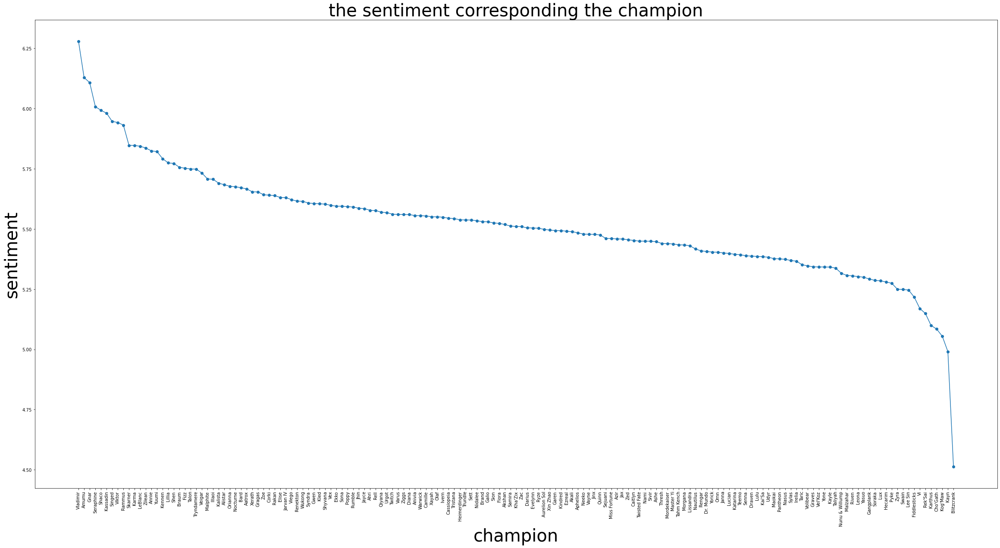

In [105]:
x = [i for i in order_champions_audio_sentiment.keys()]
y = [w for w in order_champions_audio_sentiment.values()]

fig = plt.figure(figsize=(40,20))


_ = plt.errorbar(x, y, fmt='-o')
plt.xticks([i for i in range(len(order_champions_audio_sentiment))], x, rotation = '90')
_ = plt.ylabel('sentiment',fontsize = 40)
_ = plt.xlabel('champion',fontsize = 40)
_ = plt.title('the sentiment corresponding the champion',fontsize = 40)

Text(0, 0.5, 'Count')

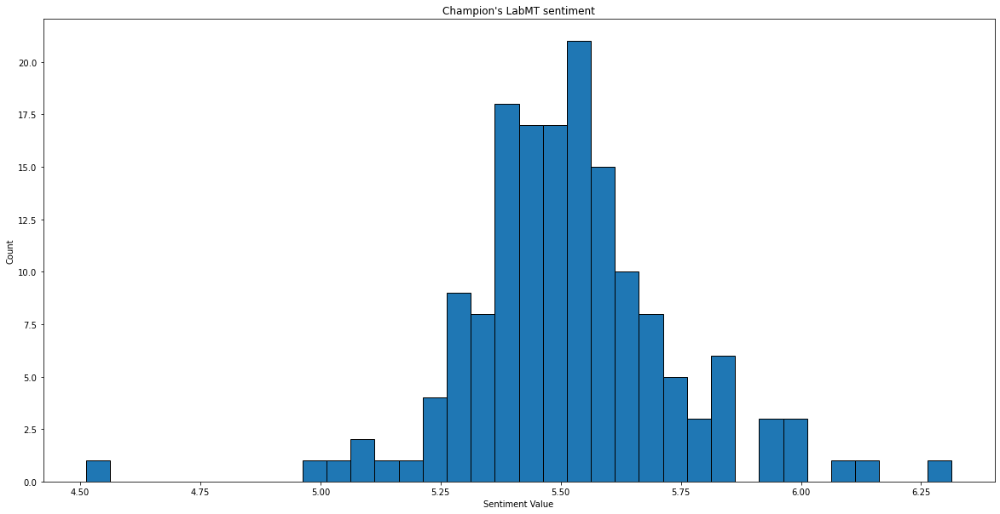

In [106]:
vader_sentiments = champions_sentiment.values()

    
# Create bins on the range (minimum sentimental value, maximum sentimental value) with intervals of 0.05
vader_bins = np.arange(min(vader_sentiments), max(vader_sentiments)+0.05, 0.05)

# Plot histogram
plt.figure(figsize=(20,10))

plt.hist(vader_sentiments, bins=vader_bins, edgecolor='black')
plt.title('Champion\'s LabMT sentiment')
plt.xlabel('Sentiment Value')
plt.ylabel('Count')

### Vader Score

In [18]:
vader = pd.read_csv('./vader_lexicon.txt',sep='\t',
            header=None,names=['TOKEN', 'MEAN-SENTIMENT-RATING', 'STANDARD DEVIATION', 'RAW-HUMAN-SENTIMENT-RATINGS'])

In [19]:
#process the raw audion text fot the vader sentiment
champion_dialogues={}
for champion in lol_df.Champion:
    with open(f'./ChampionAudioText/{champion}.txt',encoding = 'utf-8')as f:
        description = f.read()
        sentence_raw_list = literal_eval(description)
        sentence_list=[]
        for sentence in sentence_raw_list:
            sentence = re.sub("[\"]","",sentence)
            if '\'' in sentence:
                sentence = sentence.replace('\\', '')
                sentence_list.append(sentence)
            else:
                sentence_list.append(sentence)
        champion_dialogues[champion] = sentence_list 

In [20]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
vader_champion_score = {}
# loop each characters
for i in champion_dialogues.keys():
    sentences = champion_dialogues[i]
    avg_vs = 0
    # calculate sentiment for each dialogue of this character
    sentence_count = 0
    for sentence in sentences:
        vs = analyzer.polarity_scores(sentence)
        # extract the compound score we only need it
        avg_vs+=vs['compound']
        sentence_count+=1
    vader_champion_score[i] = avg_vs/sentence_count

In [112]:
df_vader_sentiment = pd.DataFrame(list(vader_champion_score.items()),columns = ['Champion','Vader Sentiment'])
df_vader_sentiment.set_index('Champion', inplace=True)
try: #In case you run it more than once
    del lol_df["Vader Sentiment"]
except:
    pass

**Store vader sentiment as column to dataframe csv file for convenience use next time**

In [113]:
lol_df=pd.merge(lol_df, df_vader_sentiment[['Vader Sentiment']], on='Champion', how='inner')

In [114]:
lol_df.to_csv('./lol_df.csv')

In [21]:
counter_vader_champion_score = Counter(vader_champion_score)
order_vader_champion_score = dict(counter_vader_champion_score.most_common())

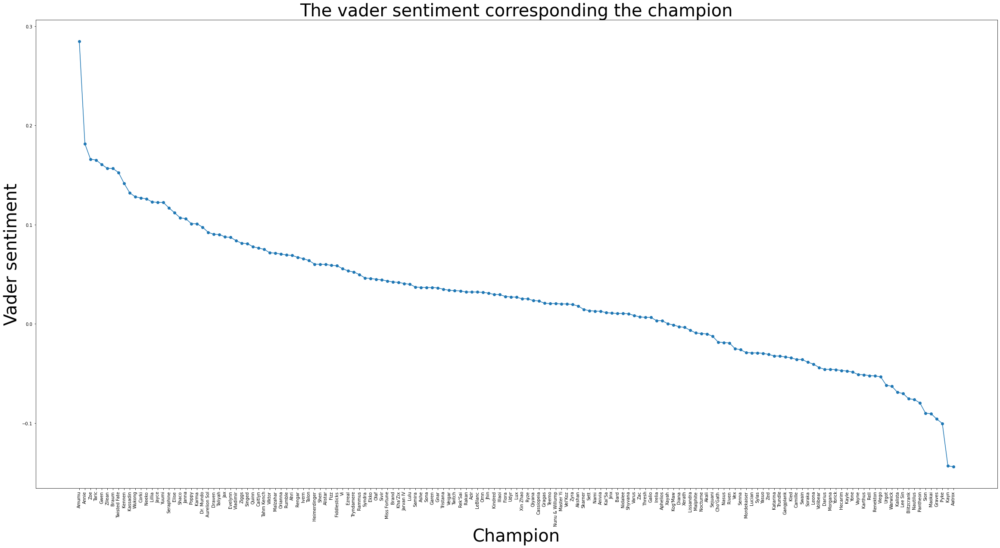

In [117]:
x = [i for i in order_vader_champion_score.keys()]
y = [w for w in order_vader_champion_score.values()]

fig = plt.figure(figsize=(40,20))


_ = plt.errorbar(x, y, fmt='-o')
plt.xticks([i for i in range(len(order_vader_champion_score))], x, rotation = '90')
_ = plt.ylabel('Vader sentiment',fontsize = 40)
_ = plt.xlabel('Champion',fontsize = 40)
_ = plt.title('The vader sentiment corresponding the champion',fontsize = 40)

Text(0, 0.5, 'Count')

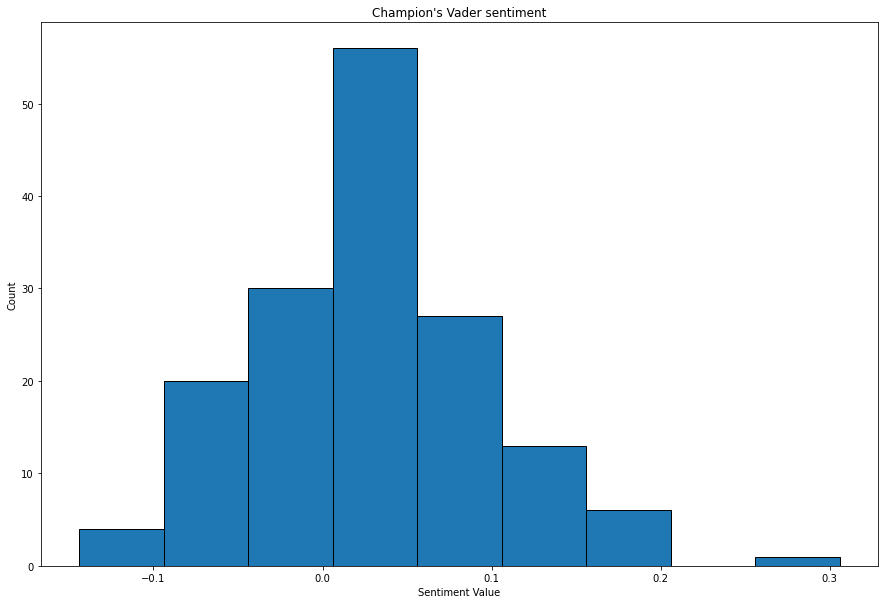

In [118]:
vader_sentiments = vader_champion_score.values()

    
# Create bins on the range (minimum sentimental value, maximum sentimental value) with intervals of 0.05
vader_bins = np.arange(min(vader_sentiments), max(vader_sentiments)+0.05, 0.05)

# Plot histogram
plt.figure(figsize=(15,10))


plt.hist(vader_sentiments, bins=vader_bins, edgecolor='black')
plt.title('Champion\'s Vader sentiment')
plt.xlabel('Sentiment Value')
plt.ylabel('Count')

## Communities Analysis

In [154]:
com_sent_mean_vader = [lol_df[lol_df["Community"]==i]["Vader Sentiment"].mean() for i in range(n_communities)]
com_vad_stdev={} #store sentiment standard deviation of each community to a dict
for i in range(n_communities):
    if len(lol_df[lol_df["Community"]==i]["Vader Sentiment"])>1:
        com_vad_stdev[i]= statistics.stdev(lol_df[lol_df["Community"]==i]["Vader Sentiment"])
    else:
        com_vad_stdev[i]=0

In [155]:
com_vad_stdev

{0: 0.08285221925510189,
 1: 0.09417413563811235,
 2: 0.06020466327662258,
 3: 0.06711804734399497,
 4: 0.0553944085631685,
 5: 0.06165513079993677,
 6: 0.09509898531526254,
 7: 0.05681470482935589,
 8: 0.0473950296752489,
 9: 0.04790202435636373,
 10: 0.06228982345371685}

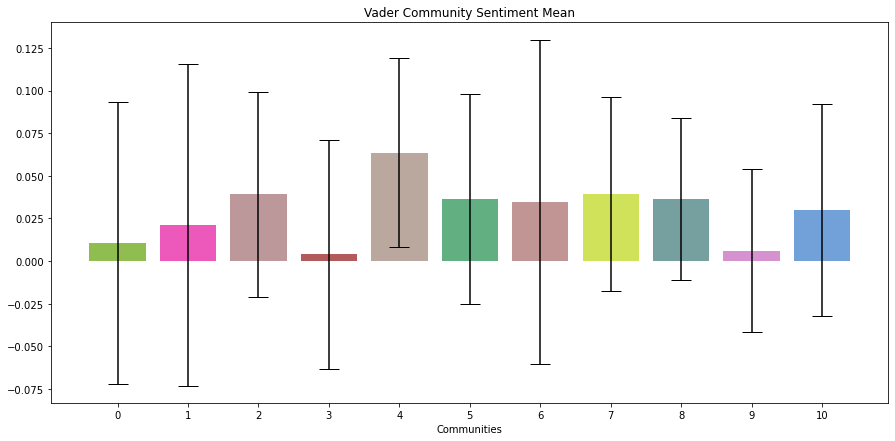

In [156]:
plt.figure(figsize=(15,7)) #Using Vader
plt.bar(range(n_communities),com_sent_mean_vader, yerr=com_vad_stdev.values(),align='center', alpha=0.7, ecolor='black', capsize=10, color = colors)
plt.xticks(range(n_communities),range(n_communities))
plt.xlabel("Communities")
plt.title('Vader Community Sentiment Mean')
plt.show()

In [196]:
com_sent_mean_mit = [lol_df[lol_df["Community"]==i]["Sentiment"].mean() for i in range(n_communities)]

com_lab_stdev ={} # store sentiment standard deviation of each community to list
for i in range(n_communities):
    if len(lol_df[lol_df["Community"]==i]["Sentiment"])>1:
        com_lab_stdev[i]= statistics.stdev(lol_df[lol_df["Community"]==i]["Sentiment"])
    else:
        com_lab_stdev[i]=0

In [87]:
com_lab_stdev

{0: 0.3270724234086358,
 1: 0.30254574053386807,
 2: 0.6644911734859764,
 3: 1.2890078275028287,
 4: 0.20604103494436865,
 5: 1.4689786413385089,
 6: 0.15832230702437292,
 7: 0.274365586860655,
 8: 0.2844490286383602,
 9: 0.37696070708649826,
 10: 0.41523918024754164}

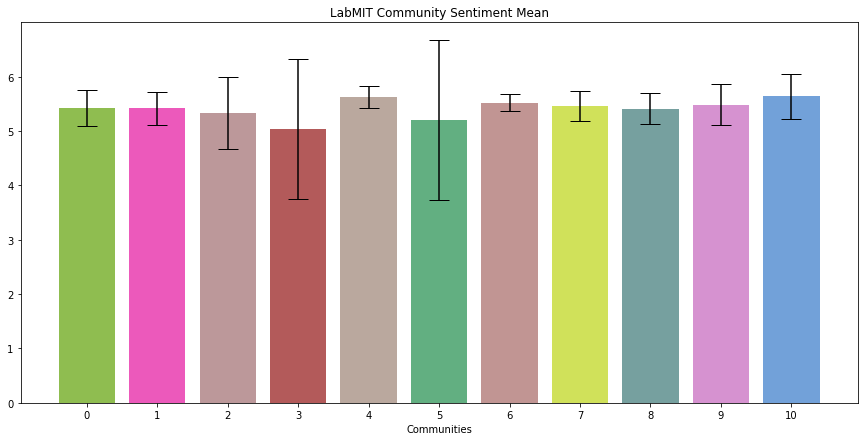

In [88]:
plt.figure(figsize=(15,7)) #Using LabMIT
plt.bar(range(n_communities),com_sent_mean_mit, yerr=com_lab_stdev.values(),align='center', alpha=0.7, ecolor='black', capsize=10, color = colors)
plt.xticks(range(n_communities),range(n_communities))
plt.xlabel("Communities")
plt.title('LabMIT Community Sentiment Mean')
plt.show()

## WordCloud

**To better understand the characteristics of each fraction in league**, we draw wordcloud to describe their theme words.

### Define wordcloud functions

Get mask picture:To draw beautiful wordclouds, we first download champion's image and then transformed it to mask for our wordcloud.<br>
_**Def a function to download champion picture as mask**_

In [12]:
def get_pic(champion):
    url = f'https://leagueoflegends.fandom.com/wiki/{champion}'
    strhtml=requests.get(url)
    soup=BeautifulSoup(strhtml.text,'lxml')
    spans = soup.select('aside figure a img')
    pic_address = spans[0]['src']
    r = requests.get(pic_address)
    with open(f"./images/{champion}.jpg", "wb") as f:
        f.write(r.content)

In [13]:
def transform_mask(champion):
    mask = np.array(Image.open(f"./images/{champion}.jpg"))
    mask = mask[:,:,0] # transform 3d image to 2d for easier visualization
    
    def transform_format(val):
        if val.all()== 0:
            return 255
        else:
            return val

    # Transform your mask into a new one that will work with the function
    transformed_mask = np.ndarray((mask.shape[0],mask.shape[1]), np.int32)

    for i in range(len(mask)):
        transformed_mask[i] = list(map(transform_format,mask[i]))
    
    return transformed_mask

_**Def a function to get theme color of image**_

In [14]:
def get_image_colors(champion):
    mask = np.array(Image.open(f"./images/{champion}.jpg"))
    image_colors  = ImageColorGenerator(mask,default_color = [0.6,0.6,0.6])
    return image_colors

_**Def a function to draw wordcloud**_

In [15]:
def generate_wordcloud(champion):
    get_pic(champion)

    freqdict = TF_IDF_explain[champion]
    
    wordcloud = WordCloud(
        stopwords=STOPWORDS,
        background_color='white',
        contour_width=3,
        contour_color='silver',
        mask=transform_mask(champion), 
        collocations=False,
    ).generate_from_frequencies(freqdict)
    
    plt.figure(figsize=(4,10))
    plt.imshow(wordcloud.recolor(color_func=get_image_colors(champion)),interpolation="bilinear")
    plt.axis('off')
    plt.show()

### Wordcloud of Champions

- The standard deviation of each champion's sentiment shows how strong this champion's emotion ups and downs, which indicates their dramatic personalities to an extend. 
- In fact, viewers or readers of artwork are more likely to be attracted by characters who bear the pain of destiny, trying to avenge or laugh with those with good personalities bringing happiness and luck to others. 
- Based on this point, by visualizing their theme words through wordcloud, we can find interesting facts about them, which would be helpful to offer suggestions when Riot Games considering which character to include in their league movie or TV series.

**The top 5 champions with positive sentiments**

In [89]:
top5_pos_champ = list(order_vader_champion_score.keys())[0:5]

Amumu


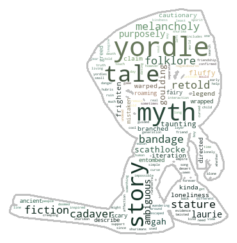

Annie


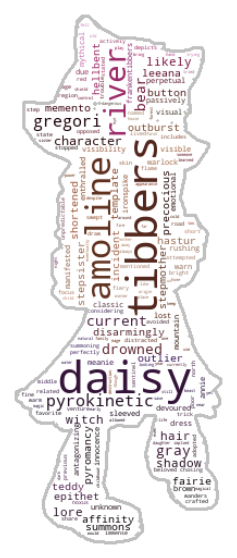

Zoe


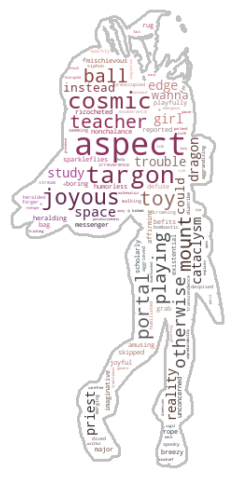

Taric


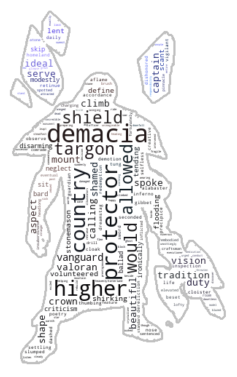

Gwen


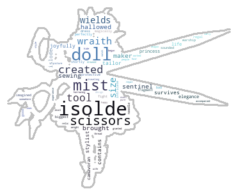

In [130]:
for i in top5_pos_champ:
    print(i)
    generate_wordcloud(i)

**The top 5 champions with negative sentiments**

In [24]:
top_5_neg_champ = list(order_vader_champion_score.keys())[-5:]

Maokai


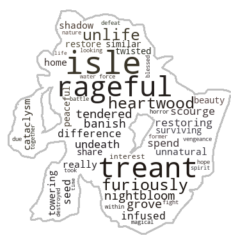

Graves


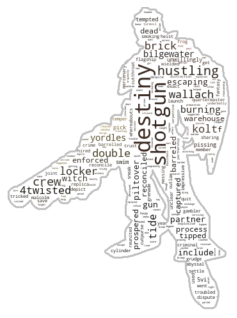

Pyke


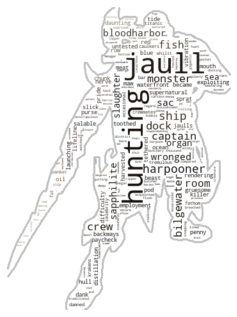

Kayn


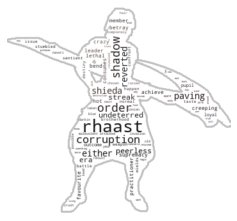

Aatrox


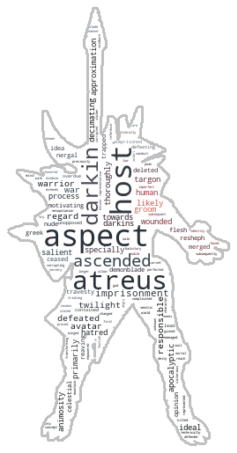

In [132]:
for i in top_5_neg_champ:
    print(i)
    generate_wordcloud(i)

### Wordcloud of Communities

**Generate wordclouds of top 5 sentimentally dinstinctive communities——by standard deviation and community sentiment score.**<br>


In [200]:
# Communities with higher the standard deviation, the more dramtic its plot behind could be
# We first Find the values of top 3 sentimentally dinstinctive communities and use values to index communities
# Between the communities we analyze their standar deviation and consider the top 3 standar deviation
top3_std = sorted(com_vad_stdev.values(),reverse=True)[0:3]
com_num1 = [list(com_vad_stdev.values()).index(i) for i in top3_std]

# Apart from sentiment standard deviation. We also need to consider each community's total sentiment score
# For comunities, we find the highest and lowest as samples
top3_sent = sorted(com_sent_mean_vader,reverse=True)[0:1] # positive community——happy story
low3_sent = sorted(com_sent_mean_vader,reverse=False)[0:1]# negative community——sad story
com_num2 = [com_sent_mean_vader.index(i) for i in top3_sent+low3_sent]
sent_dstct_com = list(set(com_num2+com_num1))

### Findings

Previously, we detect the top 5 most positive or negative champions. We also find communities with richful sentiments and dinstinct emotion waves. It's time to combine those results to see if there would be amazing findings as muse for a birth of great movie.

We combine degree, sentiment to analyse which community has the best potential to be adapted to movie

In [221]:
top10_connected_champions = [i[0] for i in sorted(G.degree, key=lambda x: x[1], reverse=True)[:5]]
potential_roles = top5_connected_champions+top5_pos_champ+top_5_neg_champ

count_dict = dict(zip(sent_dstct_com,[0,0,0,0,0]))
for i in potential_roles:
    # get community number this champion belongs to
    num = lol_df[lol_df["Champion"]==i]['Community'].item()
    # if one of the most emotional champions is in the top5 sentimental communities, output the name and community number
    if num in sent_dstct_com:
        count_dict[num]+=1
print(count_dict)

{0: 2, 1: 2, 3: 7, 4: 0, 6: 2}


As a result, by finding the times of top sentimental champions occur in each emotional communities with highest standard deviation.**It is clear that the community 3 includes the most dramatic or connected champions and itself has a good sentiment score.** Thus, it would be the best choice to be adapted for league's next film based on degree and sentiment.<br>
- Community 3 ['Akshan', 'Diana', 'Graves', 'Gwen', 'Irelia', 'Lucian', 'Neeko', 'Nidalee', 'Olaf', 'Pyke', 'Qiyana', 'Rengar', 'Riven', 'Senna', 'Vayne', 'Vex', 'Viego', 'Zyra']

**Having chosen our community, another question is, in this community, who's the central role or pushes the plot forward?**

In [119]:
# We analyze in our chosen community the top 3 champions (by their degree relevance).
deg_comm={item:G.degree(item) for item in lol_df[lol_df["Community"]==3]["Champion"]}
top3_deg_comm = sorted(deg_comm.values(), reverse=True)[0:3]
champ_comm = [key for key in deg_comm.keys() if deg_comm[key] in top3_deg_comm]
champ_comm

['Diana', 'Irelia', 'Viego']

Diana


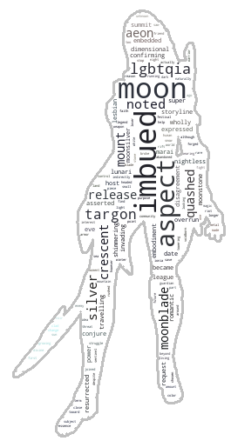

Irelia


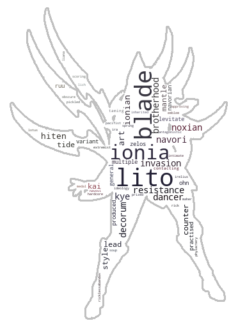

Viego


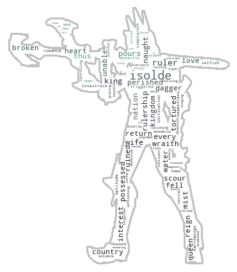

In [211]:
for i in champ_comm:
    print(i)
    generate_wordcloud(i)

By the way, Viego is the most connected character. This shows the plot of community is centred around him and champions connected with him.<br> **First,Let's take a brief look at his background story.**
>Once ruler of a long-lost kingdom, Viego perished over a thousand years ago when his attempt to bring his wife back from the dead triggered the magical catastrophe known as the Ruination. Transformed into a powerful, unliving wraith tortured by an obsessive longing for his centuries-dead queen, Viego now stands as the Ruined King, controlling the deadly Harrowings as he scours Runeterra for anything that might one day restore her, and destroying all in his path as the Black Mist pours endlessly from his cruel, broken heart.

**He sounds like a powerful but desperate king falling deeply love with his queen and would rather corrupt to bring his dead wife's life back at any cost. A good guy becomes an villian, other champions try to stop him. OKay! I would buy a ticket for it(not fan's filter)<br>**

<big>In conclusion, through network analysis, sentiment analysis, inspection on wordcloud, we have right to say Viego's story would be a wonderful choice to be the plot for an intriguing LOL movie, which would  win audience's love!</big>

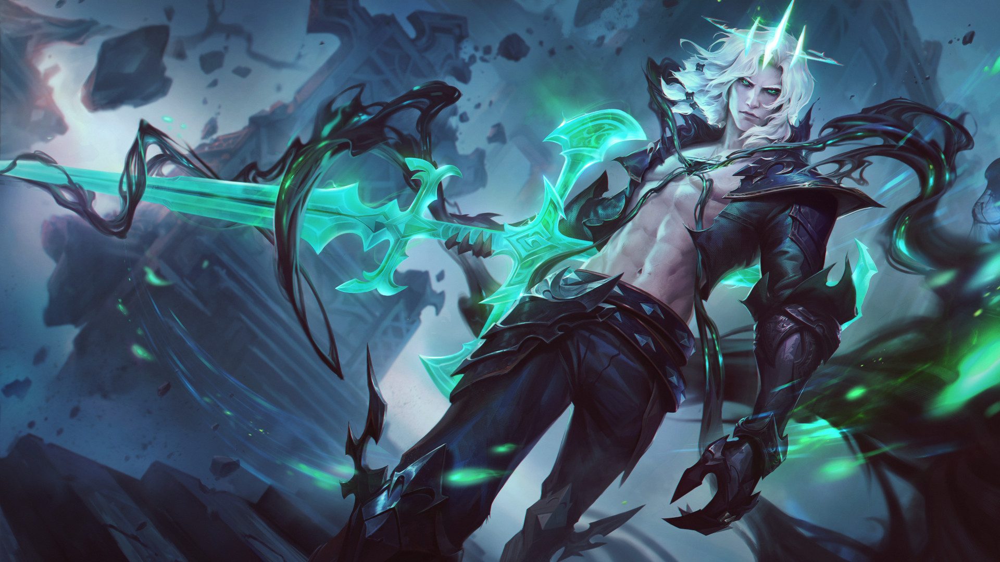